In [3]:
import numpy as np
import tensorflow as tf

from model import VAE
from utils import generate_images,visualize_latent_space,plot_latent_images
from main import *

tf.config.experimental.set_visible_devices([], 'GPU')

In [4]:
def train(latent_dim,beta,epochs,train_ds,x_test,dataset_mean,dataset_std):

    model = VAE(latent_dim)

    optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001)

    kl_loss_tracker = tf.keras.metrics.Mean(name='kl_loss')
    mse_loss_tracker = tf.keras.metrics.Mean(name='mse_loss')


    for epoch in range(epochs):

        label_list = None
        z_mu_list = None    

        for _,(imgs,labels) in train_ds.enumerate():
            
            # training loop
            with tf.GradientTape() as tape:
                # forward pass
                z_mu,z_rho,decoded_imgs = model(imgs)

                # compute loss
                mse,kl = elbo(z_mu,z_rho,decoded_imgs,imgs)
                loss = mse + beta * kl
            
            # compute gradients
            gradients = tape.gradient(loss,model.variables)

            # update weights
            optimizer.apply_gradients(zip(gradients, model.variables))

            # update metrics
            kl_loss_tracker.update_state(beta * kl)
            mse_loss_tracker.update_state(mse)

            # save encoded means and labels for latent space visualization
            if label_list is None:
                label_list = labels
            else:
                label_list = np.concatenate((label_list,labels))
                
            if z_mu_list is None:
                z_mu_list = z_mu
            else:
                z_mu_list = np.concatenate((z_mu_list,z_mu),axis=0)


        # generate new samples
        generate_images(model,dataset_mean,dataset_std,temp_x_test=None)
        # encode and decode samples from test data
        generate_images(model,dataset_mean,dataset_std,temp_x_test=x_test[:16])
        # visualize the latent space by non-linear dim reduction
        print(z_mu_list)
        print(label_list)
        visualize_latent_space(z_mu_list,label_list)
        # plot 2D digit manifold if latent dim=2
        if latent_dim==2:
            plot_latent_images(model,dataset_mean,dataset_std)

        # display metrics at the end of each epoch.
        epoch_kl,epoch_mse = kl_loss_tracker.result(),mse_loss_tracker.result()
        print(f'epoch: {epoch}, mse: {epoch_mse:.4f}, kl_div: {epoch_kl:.4f}')

        # reset metric states
        kl_loss_tracker.reset_state()
        mse_loss_tracker.reset_state()

    return

[[-0.29931584 -0.35269466]
 [ 0.9408915  -0.98787355]
 [ 0.13073003 -1.2535592 ]
 ...
 [-1.0881339  -0.29343423]
 [-1.6246297  -1.2100258 ]
 [ 1.7159759   0.57562464]]
[6 0 6 ... 6 2 7]
epoch: 0, mse: 439.2924, kl_div: 33.7710
[[ 0.72604823  0.2029108 ]
 [-1.2836857   0.6490393 ]
 [-0.9233151   0.49878284]
 ...
 [-0.87408084  0.40284228]
 [ 1.4668039   0.5585934 ]
 [ 1.9452951   0.29902282]]
[4 5 0 ... 0 7 7]
epoch: 1, mse: 382.9172, kl_div: 45.1549
[[-0.76255107 -2.1353288 ]
 [-0.12704435 -1.4895885 ]
 [-1.0971695   0.7096669 ]
 ...
 [-0.71203846 -0.81949216]
 [-0.03796743 -0.9061616 ]
 [-0.04732499 -0.20904438]]
[7 4 0 ... 2 9 8]
epoch: 2, mse: 365.2016, kl_div: 48.8723
[[ 0.63966364  0.12567192]
 [-0.04765322 -1.2515856 ]
 [-1.3465219  -1.935311  ]
 ...
 [ 0.12474787  0.2827526 ]
 [ 0.88680255  0.410963  ]
 [-1.5468507  -0.11977717]]
[5 4 2 ... 5 4 6]
epoch: 3, mse: 355.1111, kl_div: 51.1401
[[-1.2616181  -1.7807174 ]
 [ 0.24447481 -0.71807873]
 [ 1.1043191   1.2663983 ]
 ...
 [ 0.4

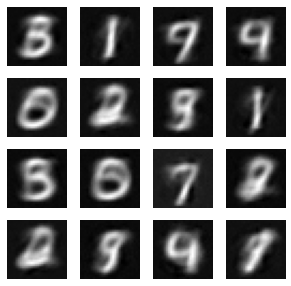

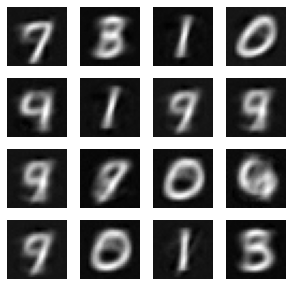

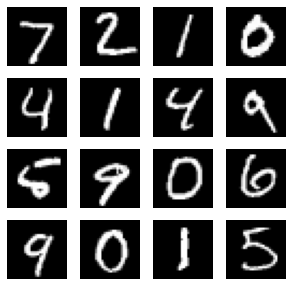

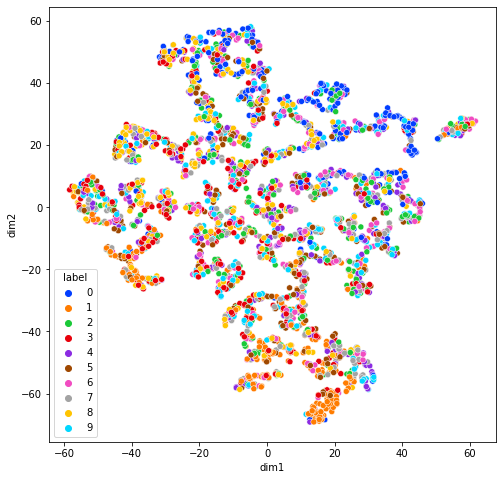

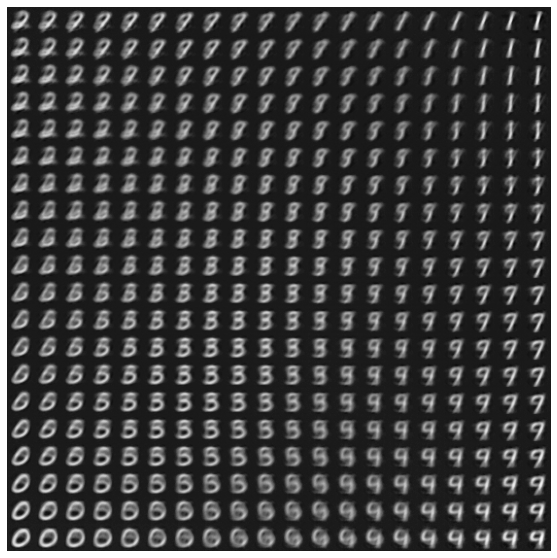

...

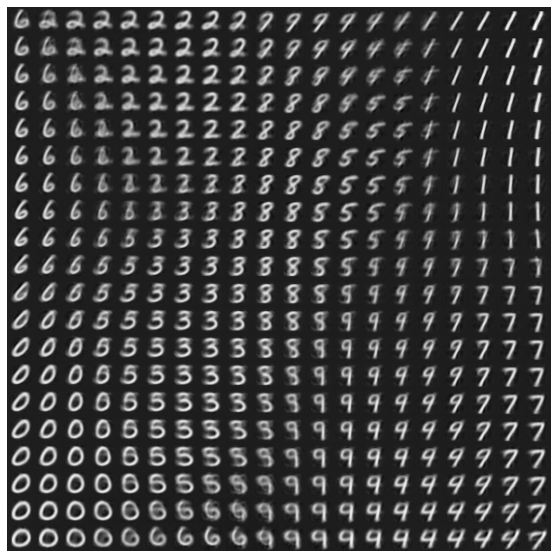

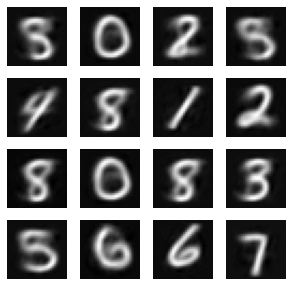

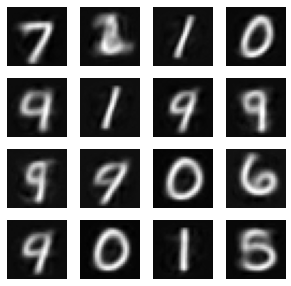

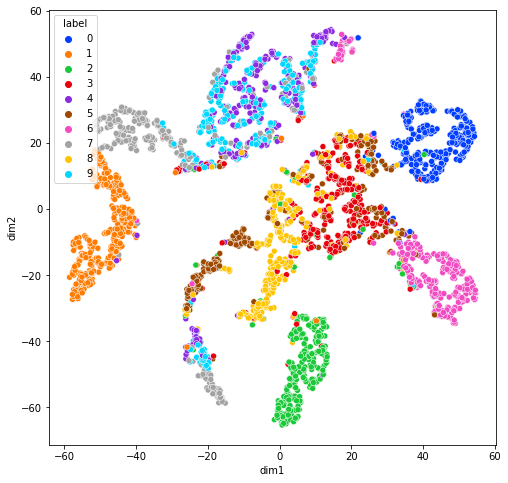

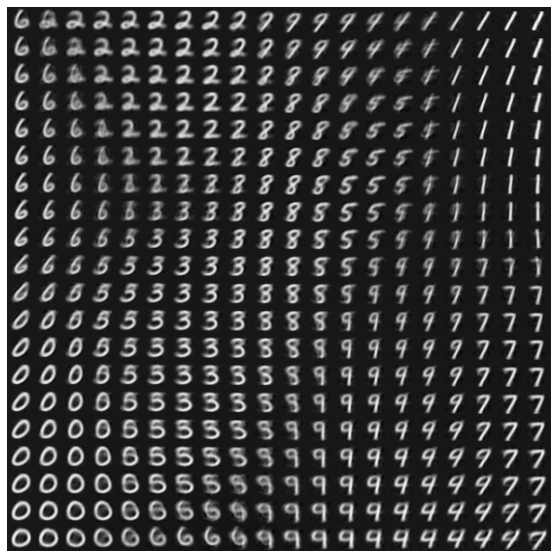

In [5]:
beta = 12.
epochs = 15
latent_dim = 2


train_ds,x_test,dataset_mean,dataset_std = prepare_data()

train(latent_dim,beta,epochs,train_ds,x_test,dataset_mean,dataset_std)